Version 1

signature align with the latents

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
!pip3 install anndata
!pip3 install scanpy
!pip3 install leidenalg

In [27]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
import matplotlib.colors as colors
import sys
import os

import torch
import torch.optim as optim
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
torch.manual_seed(0)
np.random.seed(0)
import random
random.seed(0)


In [28]:
# load expression data
data_path = '/content/drive/MyDrive/SpatialModelProject/data'
sample_id = 'BC_lab_1A'
adata_sample = sc.read_visium(
    path=os.path.join(data_path, sample_id),
    library_id =  sample_id
)
adata_sample.var_names_make_unique()

# load signature data
signature_path = data_path
sig_fname = os.path.join(signature_path, 'BC_cellsignatures.csv')
df_sig = pd.read_csv(sig_fname)

# load gsva
df_gsva_raw = pd.read_csv(os.path.join(data_path, 'markers_gsva_1A.csv'), index_col=0)
df_gsva_raw.columns = df_gsva_raw.columns.str.replace(' ', '')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [29]:
# preprocessing - remove Ribosomal & Mitochondrial genes
def preprocess(adata_raw,
               min_perc=None,
               max_perc=None,
               mt_threshold=20):
    adata = adata_raw.copy()
    
    if min_perc and max_perc:
        assert 0 < min_perc < max_perc < 100,\
            "Invalid thresholds for cells: {0}, {1}".format(min_perc, max_perc)
        min_counts = np.percentile(adata.obs['total_counts'], min_perc)
        max_counts = np.percentile(adata.obs['total_counts'], min_perc)
        sc.pp.filter_cells(adata, min_counts=min_counts, max_counts=max_counts)
    
    # Remove cells with excessive MT expressions
    # Remove MT & RB genes
    adata.var['mt'] = adata.var_names.str.startswith('MT-')
    adata.var['rb'] = np.logical_or(
        adata.var_names.str.startswith('RPS'),
        adata.var_names.str.startswith('RPL')
    )
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)
    mask_cell = adata.obs['pct_counts_mt'] < mt_threshold
    mask_gene = np.logical_and(~adata.var['mt'], ~adata.var['rb'])
    
    adata = adata[mask_cell, mask_gene] 
    
    return adata

In [30]:
# Preprocessing1: delete the mt and rp
adata_sample = preprocess(adata_sample) 

# Preprocessing2: Normalize
sc.pp.normalize_total(adata_sample, inplace=True) 

# Preprocessing3: Logarithm
sc.pp.log1p(adata_sample)

# Preprocessing4: Find the variable genes
sc.pp.highly_variable_genes(adata_sample, flavor='seurat', n_top_genes=2000, inplace=True)

/usr/local/lib/python3.7/dist-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [31]:
adata_sample

AnnData object with n_obs × n_vars = 2454 × 33421
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'spatial', 'log1p', 'hvg'
    obsm: 'spatial'

In [32]:
# merge the gene in adata & signature
sig_gname = np.unique(df_sig.values.flatten().astype(str))
sig_gname_filtered = np.intersect1d(adata_sample.var_names,sig_gname)
variable_gene = np.array(adata_sample.var_names[adata_sample.var['highly_variable']])
gene_final  = set([*variable_gene ,*sig_gname_filtered])
adata_filtered = adata_sample.to_df().loc[:,gene_final]

In [33]:
adata_filtered

,LRCH2,AC074351.1,PPP1R9B,CEP162,AC006547.1,NPIPB5,SCHIP1,MAP2K7,C6orf163,IKZF2,RARRES1,AL033527.2,SCFD2,SGPP2,GRB10,GPM6B,PLK3,CIDEC,CD8B,ARHGEF17,CCDC62,IGHG4,AC011472.4,FBXW5,NPPA,PPM1J,MT1X,FGFR4,MPC2,DLL4,CXCL2,ZNF519,HOXD11,ZFP62,AC004889.1,MAGI1,SETBP1,CHDH,SESN1,SLC26A6,...,AL158211.1,GPR12,USP53,FGF16,SEC24D,CAMK2D,VASH1,FOSB,ADGRL4,AL121890.2,HOXA13,SLC9A7,ZCCHC24,WDR27,PCDHGB7,BABAM2,CEP128,MXRA8,MGP,AC116348.1,TMEM168,GDPD5,PIGA,AC107905.1,POU3F2,TAGLN,PPDPF,RNF144A,CCNL2,IER5,MYBL2,MSR1,C1orf61,AC018742.1,LINC01445,MMP3,PGM5,EPHB2,KIR2DL4,S100A8
AAACACCAATAACTGC-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,1.099363,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,1.099363,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,1.099363,0.000000,0.0,0.000000,0.0,2.198226,1.099363,0.0,0.000000,0.0,0.0,0.0,0.0,1.099363,1.099363,0.000000,0.000000,1.099363,0.0,1.099363,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
AAACAGCTTTCAGAAG-1,0.0,0.0,0.259187,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.259187,0.0,0.0,0.000000,0.0,0.635321,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.780930,0.259187,0.0,0.0,0.0,0.000000,0.0,0.0,0.259187,0.0,0.000000,0.259187,...,0.0,0.0,0.0,0.0,0.000000,0.259187,0.259187,0.000000,0.000000,0.0,0.0,0.0,0.259187,0.259187,0.0,0.259187,0.0,0.780930,3.286205,0.0,0.000000,0.0,0.0,0.0,0.0,0.780930,2.195962,0.000000,0.635321,0.000000,0.0,0.464835,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
AAACAGGGTCTATATT-1,0.0,0.0,0.136424,0.0,0.0,0.0,0.0,0.136424,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.136424,0.0,0.000000,0.0,0.000000,0.0,0.460376,0.000000,0.0,0.958523,0.000000,0.0,0.0,0.0,0.363602,0.0,0.0,0.136424,0.0,0.256451,0.000000,...,0.0,0.0,0.0,0.0,0.136424,0.136424,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,3.217733,0.0,0.000000,0.0,0.0,0.0,0.0,0.363602,2.378918,0.000000,0.256451,0.256451,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
AAACATGGTGAGAGGA-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.241491,0.000000,0.0,0.000000,0.0,0.0,0.0,0.241491,0.0,0.241491,0.0,0.0,0.000000,0.0,0.000000,0.0,0.598529,0.0,0.000000,0.241491,0.0,1.158507,0.000000,0.0,0.0,0.0,0.241491,0.0,0.0,0.241491,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.241491,0.241491,0.241491,0.000000,0.000000,0.0,0.0,0.0,0.435861,0.241491,0.0,0.000000,0.0,0.435861,2.931435,0.0,0.000000,0.0,0.0,0.0,0.0,1.158507,1.822900,0.000000,0.598529,1.068849,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
AAACCGGGTAGGTACC-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.919434,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.919434,0.0,0.0,0.0,0.919434,0.000000,0.0,0.000000,0.0,1.390222,2.447126,0.0,0.000000,0.0,0.0,0.0,0.0,0.919434,2.569781,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.919434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,2.366042,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2.366042,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,3.011127,2.366042,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000

In [34]:
# image preparation
adata_image = adata_sample.uns['spatial'][sample_id]['images']['hires']
adata_image = (adata_image*255).astype(np.uint8)
import cv2
from google.colab.patches import cv2_imshow
lab= cv2.cvtColor(adata_image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
cl = clahe.apply(l)
limg = cv2.merge((cl,a,b))
final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

rgb_weights = [0.2989, 0.5870, 0.1140]
grayscale_image = np.dot(final[...,:3], rgb_weights)
grayscale_image = (grayscale_image -grayscale_image.min())/(grayscale_image.max()-grayscale_image.min())
grayscale_image = np.clip(grayscale_image, 0.2, 0.8)

In [35]:
# map info
spot_diameter_fullres = adata_sample.uns['spatial'][sample_id]['scalefactors']['spot_diameter_fullres']
tissue_hires_scalef = adata_sample.uns['spatial'][sample_id]['scalefactors']['tissue_hires_scalef']
circle_radius = spot_diameter_fullres *tissue_hires_scalef * 0.5 
image_spot = adata_sample.obsm['spatial'] *tissue_hires_scalef
map_info = adata_sample.obs[['array_col','array_row']]
map_info.loc[:,'imagecol'] = image_spot[:,0]
map_info.loc[:,'imagerow'] = image_spot[:,1]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [36]:
# deadling with gsva and siganture
def discretize_gsva(gsva_raw, thld=0.7):
    """
    Discretize GSVA scores for training
    
    Parameters
    ----------
    gsva_raw : pd.DataFrame
        raw GSVA matrix (shape: [S x C])
    
    """
    gsva_train = gsva_raw.apply(
        lambda x: x >= x.quantile(thld), 
        axis=0
    ).astype(np.uint8)
    
    return gsva_train


def find_spots(adata, gsva, n_nbrs=30):
    """
    Find spots representing `pure spots` & their nearest neighbors
    based on GSVA scores for each cell type
    """
    assert 'highly_variable' in adata.var_keys(), \
        "Please choose highly variable genes first"
    
    # Calculate distance with only highly variable genes
    embedding = adata[:, adata.var['highly_variable']].X.A
    pure_idxs = np.argmax(gsva.values, axis=0)
    pure_spots = gsva.idxmax(axis=0)
    
    pure_dict = {
        spot: ct 
        for (spot, ct) in zip(pure_spots, gsva.columns)
    }
    
    nbrs = NearestNeighbors(n_neighbors=n_nbrs+len(pure_spots)).fit(embedding)
    nn_graph = nbrs.kneighbors(embedding)[1] 
    
    perif_spots = []        
    perif_idxs = [nn_graph[idx].tolist() for idx in pure_idxs]
    for i, raw_idxs in enumerate(perif_idxs):
        idxs = [idx 
                for idx in raw_idxs 
                if idx not in pure_idxs or idx == raw_idxs[0]]
        perif_spots.append(gsva.index[idxs[:n_nbrs]])
    
    perif_dict = {}
    for (spots, ct) in zip(perif_spots, gsva.columns):
        for spot in spots:
            if spot not in perif_dict.keys():
                perif_dict[spot] = [ct]
            else:
                perif_dict[spot].append(ct)
        
    pure_spots = np.asarray(pure_spots)
    perif_spots = np.asarray(perif_spots).flatten()
    
    adata.obs['pure_val'] = [
        pure_dict[spot] 
        if spot in pure_spots else 'nan' for spot in adata.obs_names 
    ]
    adata.obs['perif_val'] = [
        perif_dict[spot]
        if spot in perif_spots else [np.nan] for spot in adata.obs_names 
    ]
    adata.obs['perif_unique_val'] = adata.obs['perif_val'].apply(lambda x: x[0])

    return pure_spots, perif_spots
    

In [37]:
from sklearn.neighbors import NearestNeighbors
pure_spots, perif_spots = find_spots(adata_sample, df_gsva_raw)
spot_sizes = adata_sample.obs_names.map(lambda x: 500 if x in set(pure_spots) else 50)

In [38]:
pure_spots.shape,perif_spots.shape,spot_sizes.shape

((21,), (630,), (2454,))

In [39]:
# Configure signature & gsva dataframes
sig_genes_dict = {
    sig: df_sig[sig][~pd.isna(df_sig)[sig]].tolist() 
    for sig in df_sig.columns
}

# Discretize gsva scores given different thresholds
gsva_scores_train = discretize_gsva(df_gsva_raw)

In [40]:
def calc_var_priors(adata, sig_genes_dict):
    """Calculate avg. gexp variance for each signature as priors"""
    # Subset signature genes as Union(marker_genes, highly_variable genes)
    marker_genes = list(set(
        [gene
         for genes in sig_genes_dict.values() 
         for gene in genes]
    ))
    hv_genes = adata.var_names[adata.var['highly_variable']]
    sel_genes = set(np.union1d(marker_genes, hv_genes))
    genes_dict = {}
    for ct, genes in sig_genes_dict.items():
        filtered_genes = [gene for gene in genes if gene in sel_genes]
        if len(filtered_genes) > 0:
            genes_dict[ct] = filtered_genes
            
    # Calculate signature variance priors
    sig_vars = []
    sig_vars_dict = {} 
    
    for ct, genes in genes_dict.items():
        spot_mask = adata.obs['perif_val'].apply(
            lambda x: ct in x
        ).astype(bool)
        gene_mask = adata.var_names.intersection(genes)
        ct_vars = adata[spot_mask, gene_mask].X.sum(axis=1).var()
        sig_vars.append(ct_vars)
        sig_vars_dict[ct] = ct_vars
        
    sig_vars = np.asarray(sig_vars)
    
    return sig_vars, sig_vars_dict, sel_genes

In [41]:
sig_vars, sig_vars_dict, sel_genes = calc_var_priors(adata_sample, sig_genes_dict) 
for k, v in sig_vars_dict.items():
    print("{0}: {1}".format(k, v))

Th17: 1.3639092445373535
Treg: 2.556400775909424
Th9: 1.2922437191009521
Tfh: 1.995997667312622
Th22: 1.446737289428711
CD8_T_cell_activation: 1.7145259380340576
Exhaustion_Terminal_differentiation: 0.05022300407290459
CD8+_deletional_tolerance: 1.947645902633667
CD8+_TIL_dysfunction: 3.926990032196045
Effector_cell_cytotoxicity: 1.2687230110168457
bcell: 6.054196357727051
Fibroblast: 1.6332353353500366
Monocyte: 1.0951611995697021
Macrophage: 3.476621150970459
NK: 0.32753583788871765
BC: 1.8551851511001587
GNF2_MKI67: 15.293304443359375
Basal_SC: 3.544478178024292
Her2E_SC: 4.45753812789917
LumA_SC: 1.3939592838287354
LumB_SC: 3.615548610687256


In [42]:
sig_vars

array([ 1.3639092 ,  2.5564008 ,  1.2922437 ,  1.9959977 ,  1.4467373 ,
        1.7145259 ,  0.050223  ,  1.9476459 ,  3.92699   ,  1.268723  ,
        6.0541964 ,  1.6332353 ,  1.0951612 ,  3.4766212 ,  0.32753584,
        1.8551852 , 15.293304  ,  3.5444782 ,  4.457538  ,  1.3939593 ,
        3.6155486 ], dtype=float32)

In [43]:
gsva_scores_train.loc[perif_spots, :]

,Basal_SC,BC,bcell,CD8_T_cell_activation,CD8+_deletional_tolerance,CD8+_TIL_dysfunction,Effector_cell_cytotoxicity,Exhaustion_Terminal_differentiation,Fibroblast,GNF2_MKI67,Her2E_SC,LumA_SC,LumB_SC,Macrophage,Monocyte,NK,Tfh,Th17,Th22,Th9,Treg
CTATGTGAGTCACGGC-1,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
TACAGAAACGGTGGGC-1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
TCACGGCCCAAGAGAG-1,0,1,1,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0
TGTTCCGGCCTGAGCT-1,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0
CCGAAGCATTGACCAA-1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTCAAAGAAGTGGTGT-1,0,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1,1,1
GCCATTAGCCTCAAAC-1,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,0
AGCATCATTTCGAAAG-1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1
TACCTGCTGCACTGTG-1,0,0,0,1,1,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,1


In [44]:
x_sample = torch.Tensor(adata_filtered.loc[perif_spots].to_numpy())
gsva_sig = torch.Tensor(gsva_scores_train.loc[perif_spots, :].to_numpy())

In [45]:
# datasets
from torch.utils.data import DataLoader
import torchvision 
import torchvision.transforms as transforms
import torch.nn.functional as F
import torch
import numpy as np

class shenet_traindatastack(torch.utils.data.Dataset):
    """
    return the data stack with expression and image 
    """

    def __init__(self, train_data,map_info,patch_r):

        super(shenet_traindatastack, self).__init__()
        self.image = train_data[1]
        self.genexp = train_data[0]

        self.map_info =  map_info
        self.map_xlen = map_info.loc[:,'array_col'].max()-map_info.loc[:,'array_col'].min()+1
        self.map_ylen = map_info.loc[:,'array_row'].max()-map_info.loc[:,'array_row'].min()+1
        self.spot_img_stack = []
        for i in range(len(self.genexp)):
            img_xmin = int(self.map_info.iloc[i]['imagecol'])-patch_r
            img_xmax = int(self.map_info.iloc[i]['imagecol'])+patch_r
            img_ymin = int(self.map_info.iloc[i]['imagerow'])-patch_r
            img_ymax = int(self.map_info.iloc[i]['imagerow'])+patch_r
            self.spot_img_stack.append(self.image[img_ymin:img_ymax,img_xmin:img_xmax])

    def __getitem__(self, idx):
        return np.array(self.genexp.iloc[idx]),self.spot_img_stack[idx],self.map_info.index[idx]

    def __len__(self):
        return len(self.genexp)

In [46]:
# create data loader
batch_size = 8
patch_r = 13

trainset = shenet_traindatastack([adata_filtered,grayscale_image],map_info,patch_r)
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True)

In [47]:
len(sig_vars)

21

In [71]:
class poe_model_sig(nn.Module):

    def __init__(self):

        super(poe_model_sig, self).__init__()

        self.c_bn = len(sig_vars) # latent number, numbers of bottle neck
        self.c_in = len(gene_final) # number of genes 
        self.sig_vars_prior = torch.Tensor(sig_vars).to(device) # variance of signature/pure spots
        
        # For gene expression
        self.linVAE_enc = nn.Sequential(nn.Linear(self.c_in, 128, bias=True),
                                  nn.BatchNorm1d(128, momentum=0.01, eps=0.001),
                                  nn.ReLU(),
                                  )
        self.linVAE_fc_mu = nn.Linear(128, self.c_bn)
        self.linVAE_fc_logvar = nn.Linear(128, self.c_bn)

        self.linVAE_z_fc = nn.Linear(self.c_bn, 128)
        self.linVAE_dec = nn.Sequential(
                                  nn.Linear(128, self.c_in,bias=True),
                                  nn.BatchNorm1d(self.c_in, momentum=0.01, eps=0.001),
                                  nn.ReLU(),
                                  )
        
        # For image 
        self.imgVAE_enc = nn.Sequential(nn.Linear(patch_r*patch_r*4, 128, bias=True), # flatten the images into 1D
                                  nn.BatchNorm1d(128, momentum=0.01, eps=0.001),
                                  nn.ReLU(),                                 
                                  )
        self.imgVAE_fc_mu = nn.Linear(128, self.c_bn)
        self.imgVAE_fc_logvar = nn.Linear(128, self.c_bn)

        self.imgVAE_z_fc = nn.Linear(self.c_bn, 128)
        self.imgVAE_dec = nn.Sequential(nn.Linear(128, patch_r*patch_r*4, bias=True),
                                  nn.BatchNorm1d(patch_r*patch_r*4, momentum=0.01, eps=0.001),
                                  nn.ReLU(),                                 
                                  )
        
        self.POE_z_fc = nn.Linear(self.c_bn, 128)
        self.POE_dec = nn.Sequential(nn.Linear(128, 512, bias=True),
                                     nn.BatchNorm1d(512, momentum=0.01, eps=0.001),
                                     nn.ReLU(), 
                                     nn.Linear(512, 2048, bias=True),
                                     nn.BatchNorm1d(2048, momentum=0.01, eps=0.001),
                                     nn.ReLU(), 
                                     nn.Linear(2048, self.c_in,bias=True),
                                     nn.BatchNorm1d(self.c_in, momentum=0.01, eps=0.001),
                                     nn.ReLU(),
                                  )
        
    def reparameterize(self, mu, log_var):
        """
        :param mu: mean from the encoder's latent space
        :param log_var: log variance from the encoder's latent space
        """
        std = torch.exp(0.5*log_var) # standard deviation
        eps = torch.randn_like(std) # `randn_like` as we need the same size
        sample = mu + (eps * std) # sampling
        return sample


    def predict_linVAE(self, x, x_sig):

        batch, _, = x.shape
        hidden = self.linVAE_enc(x)
        hidden_sig = self.linVAE_enc(x_sig)
        
        mu = self.linVAE_fc_mu(hidden)
        mu_sig = self.linVAE_fc_mu(hidden_sig)
        #log_var = self.linVAE_fc_logvar(hidden)
        #use the prior std instead of fc
        sig_stds = torch.sqrt(self.sig_vars_prior)
        log_var = sig_stds.repeat(mu.shape[0], 1)
        log_var_sig = sig_stds.repeat(mu_sig.shape[0], 1)

        z = self.reparameterize(mu, log_var)
        z_sig = self.reparameterize(mu_sig, log_var_sig)

        x = self.linVAE_z_fc(z)
        x_sig = self.linVAE_z_fc(z_sig)
        recon = self.linVAE_dec(x)
        recon_sig = self.linVAE_dec(x_sig)

        return recon, recon_sig, mu, log_var, mu_sig, log_var_sig
    
    def predict_imgVAE(self, x):

        batch, _= x.shape
        hidden = self.imgVAE_enc(x)
    
        mu = self.imgVAE_fc_mu(hidden)  
        log_var = self.imgVAE_fc_logvar(hidden)

        z = self.reparameterize(mu, log_var)

        x = self.imgVAE_z_fc(z) 
        reconstruction = self.imgVAE_dec(x)

        return reconstruction, mu, log_var

    def predictor_POE(self, mu_exp, logvar_exp, mu_sig, logvar_sig, mu_img, logvar_img):

        var_poe = torch.div(1., 
                            1 + 
                            torch.div(1., torch.exp(logvar_exp)) + 
                            #torch.div(1., torch.exp(logvar_sig)) + 
                            torch.div(1., torch.exp(logvar_img))
                            )
        
        mu_poe = var_poe * (0 + 
                            mu_exp * torch.div(1., torch.exp(logvar_exp)+1e-5) + 
                            #mu_sig * torch.div(1., torch.exp(logvar_sig)+1e-5) +
                            mu_img * torch.div(1., torch.exp(logvar_img)+1e-5)                           
                            )
        
        z = self.reparameterize(mu_poe, torch.log(var_poe+0.001))
        
        x = self.POE_z_fc(z)

        batch, _, = x.shape
        reconstruction =  self.POE_dec(x)

        return reconstruction, mu_poe,torch.log(var_poe+0.001)
    

In [80]:
from tqdm import tqdm
import torch

def final_loss(bce_loss_exp,
               bce_loss_sig,
               bce_loss_img,
               bce_loss_poe, 
               mu_exp, logvar_exp,
               mu_sig, logvar_sig,
               mu_img, logvar_img, 
               mu_poe, logvar_poe):

    # joint loss
    Loss_IBJ = 2* bce_loss_poe + beta * (-0.5 * torch.sum(1+logvar_poe-mu_poe.pow(2)-logvar_poe.exp()))
    
    # multiple loss
    Loss_IBM = (bce_loss_exp + bce_loss_img + 
               beta * (-0.5 * torch.sum(1+logvar_exp-mu_exp.pow(2)-logvar_exp.exp())) + 
               beta * (-0.5 * torch.sum(1+logvar_sig-mu_sig.pow(2)-logvar_sig.exp())) +
               beta * (-0.5 * torch.sum(1+logvar_img-mu_img.pow(2)-logvar_img.exp())) )

    return Loss_IBJ + alpha * Loss_IBM + F.binary_cross_entropy_with_logits(mu_sig.to(device), gsva_sig.to(device))

In [81]:
def train(model, dataloader, dataset, device,optimizer, criterion,criterion_img):
    model.train()

    running_loss = 0.0
    counter = 0
    for i,(data_exp,data_img,data_loc) in tqdm(enumerate(dataloader),total = int(len(dataset)/dataloader.batch_size)):
        
        counter +=1
        mini_batch,_,_= data_img.shape
        data_img = data_img.reshape(mini_batch,-1).float()
        optimizer.zero_grad()

        # gene expression, 1D data
        data_exp = data_exp.to(device)  
        recon_exp, recon_sig, mu_exp, logvar_exp, mu_sig, logvar_sig = model.predict_linVAE(data_exp, x_sample.to(device))

        # image, 2D data
        data_img = data_img.to(device)  
        recon_img, mu_img, logvar_img = model.predict_imgVAE(data_img)

        # POE
        recon_poe, mu_poe,logvar_poe = model.predictor_POE(mu_exp, logvar_exp, mu_sig, logvar_sig, mu_img, logvar_img)

        # calculate loss
        bce_loss_exp = criterion(recon_exp, data_exp)
        bce_loss_img = criterion(recon_img, data_img)
        #print(recon_sig.shape)
        #print(x_sample.shape)
        bce_loss_sig = criterion(recon_sig, x_sample.to(device))
        bce_loss_poe = criterion(recon_poe,data_exp)
        
        
        loss = final_loss(bce_loss_exp,
                         bce_loss_sig,
                         bce_loss_img, 
                         bce_loss_poe, 
                         mu_exp, logvar_exp,
                         mu_sig, logvar_sig,
                         mu_img, logvar_img,
                         mu_poe, logvar_poe,
                        ) 
        
        loss.backward()
        running_loss += loss.item()
        optimizer.step()
    train_loss = running_loss / counter
    return train_loss

In [82]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# initialize the model
model = poe_model_sig().to(device)
train_loss = []
# set the learning parameters
lr1 = 0.001
lr2 = 0.0001

alpha = 5
beta = 0.001
optimizer1 = optim.Adam(model.parameters(), lr=lr1)
optimizer2 = optim.Adam(model.parameters(), lr=lr2)
criterion = nn.MSELoss(reduction='sum')
criterion_img = nn.BCELoss(reduction='mean')

In [83]:
epochs= 30
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    train_epoch_loss = train(model,trainloader, trainset, device,optimizer1, criterion,criterion_img)
    train_loss.append(train_epoch_loss)
    torch.cuda.empty_cache()
    print(f"Train Loss: {train_epoch_loss:.4f}")
print('finish lower training rate')
torch.save(model.state_dict(), '/content/drive/MyDrive/SpatialModelProject/0928_gsva_signature_low_v1.pt')

Epoch 1 of 30


307it [00:06, 44.31it/s]


Train Loss: 46444.7875
Epoch 2 of 30


307it [00:06, 45.46it/s]                         


Train Loss: 22633.7865
Epoch 3 of 30


307it [00:06, 46.89it/s]


Train Loss: 19529.6671
Epoch 4 of 30


307it [00:06, 46.54it/s]                         


Train Loss: 18136.2961
Epoch 5 of 30


307it [00:06, 46.54it/s]                         


Train Loss: 16976.2150
Epoch 6 of 30


307it [00:06, 46.61it/s]                         


Train Loss: 16384.1039
Epoch 7 of 30


307it [00:06, 46.58it/s]                         


Train Loss: 15858.8097
Epoch 8 of 30


307it [00:06, 46.22it/s]                         


Train Loss: 15428.7106
Epoch 9 of 30


307it [00:06, 46.47it/s]                         


Train Loss: 15200.0457
Epoch 10 of 30


307it [00:06, 46.64it/s]                         


Train Loss: 14971.0419
Epoch 11 of 30


307it [00:06, 47.02it/s]                         


Train Loss: 14717.3076
Epoch 12 of 30


307it [00:06, 46.53it/s]


Train Loss: 14402.5074
Epoch 13 of 30


307it [00:06, 46.98it/s]


Train Loss: 14131.2632
Epoch 14 of 30


307it [00:06, 46.78it/s]                         


Train Loss: 13990.3466
Epoch 15 of 30


307it [00:06, 47.00it/s]


Train Loss: 13329.7935
Epoch 16 of 30


307it [00:06, 47.40it/s]                         


Train Loss: 13311.5321
Epoch 17 of 30


307it [00:06, 47.20it/s]                         


Train Loss: 13115.4435
Epoch 18 of 30


307it [00:06, 46.89it/s]                         


Train Loss: 12958.0632
Epoch 19 of 30


307it [00:06, 46.87it/s]                         


Train Loss: 12899.4163
Epoch 20 of 30


307it [00:06, 46.63it/s]                         


Train Loss: 13013.2782
Epoch 21 of 30


307it [00:06, 46.47it/s]                         


Train Loss: 12913.5671
Epoch 22 of 30


307it [00:06, 46.69it/s]                         


Train Loss: 12801.2366
Epoch 23 of 30


307it [00:06, 46.99it/s]                         


Train Loss: 12714.9290
Epoch 24 of 30


307it [00:06, 46.78it/s]


Train Loss: 12668.0381
Epoch 25 of 30


307it [00:06, 46.36it/s]


Train Loss: 12581.2503
Epoch 26 of 30


307it [00:06, 46.92it/s]                         


Train Loss: 12578.0567
Epoch 27 of 30


307it [00:06, 46.91it/s]                         


Train Loss: 12516.7601
Epoch 28 of 30


307it [00:06, 46.47it/s]


Train Loss: 12465.1958
Epoch 29 of 30


307it [00:06, 45.35it/s]                         


Train Loss: 12448.3885
Epoch 30 of 30


307it [00:06, 46.04it/s]                         


Train Loss: 12472.9698
finish lower training rate


In [84]:
epochs= 100
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    train_epoch_loss = train(model,trainloader, trainset, device,optimizer2, criterion,criterion_img)
    train_loss.append(train_epoch_loss)
    torch.cuda.empty_cache()
    print(f"Train Loss: {train_epoch_loss:.4f}")
print('finish lower training rate')
torch.save(model.state_dict(), '/content/drive/MyDrive/SpatialModelProject/0928_gsva_signature_high_v1.pt')

Epoch 1 of 100


307it [00:06, 44.70it/s]                         


Train Loss: 12397.6984
Epoch 2 of 100


307it [00:06, 46.29it/s]                         


Train Loss: 12324.9487
Epoch 3 of 100


307it [00:06, 46.23it/s]                         


Train Loss: 12382.8232
Epoch 4 of 100


307it [00:06, 46.49it/s]


Train Loss: 12355.5562
Epoch 5 of 100


307it [00:06, 46.19it/s]                         


Train Loss: 12352.1777
Epoch 6 of 100


307it [00:06, 46.34it/s]                         


Train Loss: 12399.1331
Epoch 7 of 100


307it [00:06, 46.12it/s]                         


Train Loss: 12398.0068
Epoch 8 of 100


307it [00:06, 46.56it/s]                         


Train Loss: 12358.6266
Epoch 9 of 100


307it [00:06, 46.07it/s]                         


Train Loss: 12334.4382
Epoch 10 of 100


307it [00:06, 46.68it/s]                         


Train Loss: 12364.2718
Epoch 11 of 100


307it [00:06, 46.88it/s]                         


Train Loss: 12363.9231
Epoch 12 of 100


307it [00:06, 46.99it/s]


Train Loss: 12354.5044
Epoch 13 of 100


307it [00:06, 46.56it/s]                         


Train Loss: 12350.4426
Epoch 14 of 100


307it [00:06, 46.46it/s]


Train Loss: 12359.5887
Epoch 15 of 100


307it [00:06, 46.50it/s]                         


Train Loss: 12337.0174
Epoch 16 of 100


307it [00:06, 46.38it/s]                         


Train Loss: 12368.7241
Epoch 17 of 100


307it [00:06, 46.61it/s]


Train Loss: 12346.6762
Epoch 18 of 100


307it [00:06, 46.92it/s]                         


Train Loss: 12341.2815
Epoch 19 of 100


307it [00:06, 46.83it/s]                         


Train Loss: 12300.1380
Epoch 20 of 100


307it [00:06, 46.58it/s]                         


Train Loss: 12371.3769
Epoch 21 of 100


307it [00:06, 46.12it/s]                         


Train Loss: 12284.5671
Epoch 22 of 100


307it [00:06, 46.95it/s]                         


Train Loss: 12269.3225
Epoch 23 of 100


307it [00:06, 46.32it/s]


Train Loss: 12315.3760
Epoch 24 of 100


307it [00:06, 46.52it/s]                         


Train Loss: 12287.2874
Epoch 25 of 100


307it [00:06, 46.65it/s]


Train Loss: 12308.1983
Epoch 26 of 100


307it [00:06, 46.54it/s]                         


Train Loss: 12293.1441
Epoch 27 of 100


307it [00:06, 47.24it/s]                         


Train Loss: 12285.7787
Epoch 28 of 100


307it [00:06, 46.56it/s]                         


Train Loss: 12301.0781
Epoch 29 of 100


307it [00:06, 46.67it/s]                         


Train Loss: 12307.1155
Epoch 30 of 100


307it [00:06, 46.93it/s]                         


Train Loss: 12259.2553
Epoch 31 of 100


307it [00:06, 47.56it/s]                         


Train Loss: 12294.4812
Epoch 32 of 100


307it [00:06, 47.03it/s]                         


Train Loss: 12284.8982
Epoch 33 of 100


307it [00:06, 46.79it/s]                         


Train Loss: 12288.5191
Epoch 34 of 100


307it [00:06, 46.72it/s]                         


Train Loss: 12246.5545
Epoch 35 of 100


307it [00:06, 47.03it/s]                         


Train Loss: 12336.1532
Epoch 36 of 100


307it [00:06, 47.38it/s]                         


Train Loss: 12269.4026
Epoch 37 of 100


307it [00:06, 47.00it/s]


Train Loss: 12225.0906
Epoch 38 of 100


307it [00:06, 46.16it/s]


Train Loss: 12240.6620
Epoch 39 of 100


307it [00:06, 46.52it/s]


Train Loss: 12231.7312
Epoch 40 of 100


307it [00:06, 47.26it/s]                         


Train Loss: 12233.1392
Epoch 41 of 100


307it [00:06, 46.67it/s]                         


Train Loss: 12275.8076
Epoch 42 of 100


307it [00:06, 46.55it/s]


Train Loss: 12253.5355
Epoch 43 of 100


307it [00:06, 45.97it/s]


Train Loss: 12268.5195
Epoch 44 of 100


307it [00:06, 47.14it/s]                         


Train Loss: 12265.1030
Epoch 45 of 100


307it [00:06, 47.57it/s]                         


Train Loss: 12246.6884
Epoch 46 of 100


307it [00:06, 46.71it/s]                         


Train Loss: 12261.9086
Epoch 47 of 100


307it [00:06, 46.17it/s]                         


Train Loss: 12257.4392
Epoch 48 of 100


307it [00:06, 46.51it/s]                         


Train Loss: 12288.9186
Epoch 49 of 100


307it [00:06, 46.49it/s]


Train Loss: 12260.9091
Epoch 50 of 100


307it [00:06, 47.24it/s]                         


Train Loss: 12221.7153
Epoch 51 of 100


307it [00:06, 47.34it/s]                         


Train Loss: 12229.9498
Epoch 52 of 100


307it [00:06, 46.65it/s]                         


Train Loss: 12237.3547
Epoch 53 of 100


307it [00:06, 46.52it/s]                         


Train Loss: 12195.8631
Epoch 54 of 100


307it [00:06, 45.83it/s]                         


Train Loss: 12218.9168
Epoch 55 of 100


307it [00:06, 46.97it/s]                         


Train Loss: 12201.8617
Epoch 56 of 100


307it [00:06, 46.41it/s]                         


Train Loss: 12202.5248
Epoch 57 of 100


307it [00:06, 46.29it/s]


Train Loss: 12221.8818
Epoch 58 of 100


307it [00:06, 46.47it/s]                         


Train Loss: 12219.7456
Epoch 59 of 100


307it [00:06, 46.47it/s]


Train Loss: 12258.0569
Epoch 60 of 100


307it [00:06, 46.58it/s]                         


Train Loss: 12185.4368
Epoch 61 of 100


307it [00:06, 46.01it/s]


Train Loss: 12179.5078
Epoch 62 of 100


307it [00:06, 47.06it/s]                         


Train Loss: 12214.1058
Epoch 63 of 100


307it [00:06, 45.65it/s]                         


Train Loss: 12246.2445
Epoch 64 of 100


307it [00:06, 46.47it/s]                         


Train Loss: 12210.7377
Epoch 65 of 100


307it [00:06, 46.88it/s]                         


Train Loss: 12213.8054
Epoch 66 of 100


307it [00:06, 47.00it/s]                         


Train Loss: 12189.7468
Epoch 67 of 100


307it [00:06, 47.12it/s]


Train Loss: 12167.7137
Epoch 68 of 100


307it [00:06, 46.30it/s]                         


Train Loss: 12197.5885
Epoch 69 of 100


307it [00:06, 46.86it/s]                         


Train Loss: 12203.3239
Epoch 70 of 100


307it [00:06, 46.59it/s]


Train Loss: 12212.9903
Epoch 71 of 100


307it [00:06, 46.38it/s]                         


Train Loss: 12207.2280
Epoch 72 of 100


307it [00:06, 46.37it/s]                         


Train Loss: 12188.6638
Epoch 73 of 100


307it [00:06, 46.19it/s]


Train Loss: 12199.8176
Epoch 74 of 100


307it [00:06, 47.01it/s]                         


Train Loss: 12199.7052
Epoch 75 of 100


307it [00:06, 46.47it/s]                         


Train Loss: 12171.2605
Epoch 76 of 100


307it [00:06, 46.39it/s]                         


Train Loss: 12178.5221
Epoch 77 of 100


307it [00:06, 46.25it/s]                         


Train Loss: 12178.7157
Epoch 78 of 100


307it [00:06, 46.11it/s]                         


Train Loss: 12167.2339
Epoch 79 of 100


307it [00:06, 46.16it/s]                         


Train Loss: 12159.8254
Epoch 80 of 100


307it [00:06, 46.53it/s]                         


Train Loss: 12149.2977
Epoch 81 of 100


307it [00:06, 46.25it/s]                         


Train Loss: 12118.1008
Epoch 82 of 100


307it [00:06, 46.30it/s]                         


Train Loss: 12190.9430
Epoch 83 of 100


307it [00:06, 46.59it/s]                         


Train Loss: 12161.1071
Epoch 84 of 100


307it [00:06, 45.75it/s]


Train Loss: 12201.6778
Epoch 85 of 100


307it [00:06, 46.44it/s]                         


Train Loss: 12157.3126
Epoch 86 of 100


307it [00:06, 45.89it/s]                         


Train Loss: 12146.6410
Epoch 87 of 100


307it [00:06, 46.26it/s]                         


Train Loss: 12171.5576
Epoch 88 of 100


307it [00:06, 45.34it/s]                         


Train Loss: 12166.9179
Epoch 89 of 100


307it [00:06, 45.79it/s]                         


Train Loss: 12189.3194
Epoch 90 of 100


307it [00:06, 46.19it/s]


Train Loss: 12165.3654
Epoch 91 of 100


307it [00:06, 45.78it/s]                         


Train Loss: 12127.3118
Epoch 92 of 100


307it [00:06, 45.78it/s]                         


Train Loss: 12120.7419
Epoch 93 of 100


307it [00:06, 46.62it/s]


Train Loss: 12151.9625
Epoch 94 of 100


307it [00:06, 46.53it/s]                         


Train Loss: 12155.2868
Epoch 95 of 100


307it [00:06, 46.61it/s]                         


Train Loss: 12107.6801
Epoch 96 of 100


307it [00:06, 47.08it/s]                         


Train Loss: 12123.0286
Epoch 97 of 100


307it [00:06, 46.36it/s]                         


Train Loss: 12169.0154
Epoch 98 of 100


307it [00:06, 46.37it/s]                         


Train Loss: 12167.9495
Epoch 99 of 100


307it [00:06, 46.27it/s]                         


Train Loss: 12132.4745
Epoch 100 of 100


307it [00:06, 46.22it/s]                         


Train Loss: 12149.3972
finish lower training rate


In [ ]:
fig,axs=plt.subplots(1,2,figsize=(6,2.5),dpi=200)

ax=axs[0]
all_spot = [np.where(adata_filtered.index==pure_spots[i])[0][0] for i in range(pure_spots.shape[0])]
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=1)
g=ax.scatter(all_loc[all_spot,0],-all_loc[all_spot,1],s=1)
ax.set_title('Pure spots')
ax.set_xticks([])
ax.set_yticks([])

ax=axs[1]
all_spot = [np.where(adata_filtered.index==perif_spots[i])[0][0] for i in range(perif_spots.shape[0])]
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=1)
g=ax.scatter(all_loc[all_spot,0],-all_loc[all_spot,1],s=1)
ax.set_title('Peri spots')
#ax.axis('off')
ax.set_xticks([])
ax.set_yticks([])

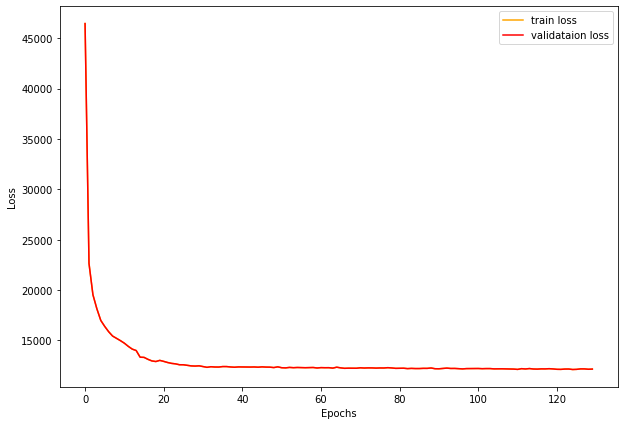

In [85]:
def save_loss_plot(train_loss, valid_loss):
    # loss plots
    plt.figure(figsize=(10, 7))
    plt.plot(train_loss, color='orange', label='train loss')
    plt.plot(valid_loss, color='red', label='validataion loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.savefig('loss.jpg')
    plt.show()
save_loss_plot(train_loss, train_loss)

In [87]:
recon_exp_stack = np.zeros(trainset.genexp.shape)
recon_img_stack = np.zeros([trainset.genexp.shape[0],patch_r*2,patch_r*2,1])
recon_poe_stack = np.zeros(trainset.genexp.shape)

wholeimg_stitch = np.zeros([2000,2000,1])*(-1)
recon_wholeimg_stitch = np.zeros([2000,2000,1])*(-1)

mu_exp_stack = np.zeros([trainset.genexp.shape[0],len(sig_vars)])
mu_img_stack = np.zeros([trainset.genexp.shape[0],len(sig_vars)])
mu_poe_stack = np.zeros([trainset.genexp.shape[0],len(sig_vars)])

for i,(data_exp,data_img,data_loc) in tqdm(enumerate(trainloader),total = int(len(trainset)/trainloader.batch_size)):

        mini_batch,_,_ = data_img.shape
        data_img = data_img.reshape(mini_batch,-1).float()
        data_exp = data_exp.to(device) 
        data_img = data_img.to(device)  

        recon_exp, recon_sig, mu_exp, logvar_exp, mu_sig, logvar_sig = model.predict_linVAE(data_exp, x_sample.to(device))

        recon_img, mu_img, logvar_img = model.predict_imgVAE(data_img)

        recon_poe, mu_poe,logvar_poe = model.predictor_POE(mu_exp, logvar_exp, mu_sig, logvar_sig, mu_img, logvar_img)
        
        for ii in range(mini_batch):
          loc = np.where(data_loc[ii]==map_info.index)
          recon_exp_stack[loc[0][0]] = recon_exp[ii].cpu().detach().numpy()
          recon_img_stack[loc[0][0]] = recon_img.reshape([recon_img.shape[0],patch_r*2,patch_r*2,1])[ii].cpu().detach().numpy()
          recon_poe_stack[loc[0][0]] = recon_poe[ii].cpu().detach().numpy()
          
          mu_exp_stack[loc[0][0]] = mu_exp[ii].cpu().detach().numpy()
          mu_img_stack[loc[0][0]] = mu_img[ii].cpu().detach().numpy()
          mu_poe_stack[loc[0][0]] = mu_poe[ii].cpu().detach().numpy()


          image_col = map_info.iloc[loc[0][0]]['imagecol']
          image_row = map_info.iloc[loc[0][0]]['imagerow']

          recon_wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:] = recon_img.reshape([mini_batch,patch_r*2,patch_r*2,1])[ii].cpu().detach().numpy()
          wholeimg_stitch[int(image_row)-patch_r:int(image_row)+patch_r,int(image_col)-patch_r:int(image_col)+patch_r,:] = data_img.reshape([mini_batch,patch_r*2,patch_r*2,1])[ii].cpu().detach().numpy()

307it [00:05, 55.41it/s]


Text(0.5, 1.0, 'Inferred image')

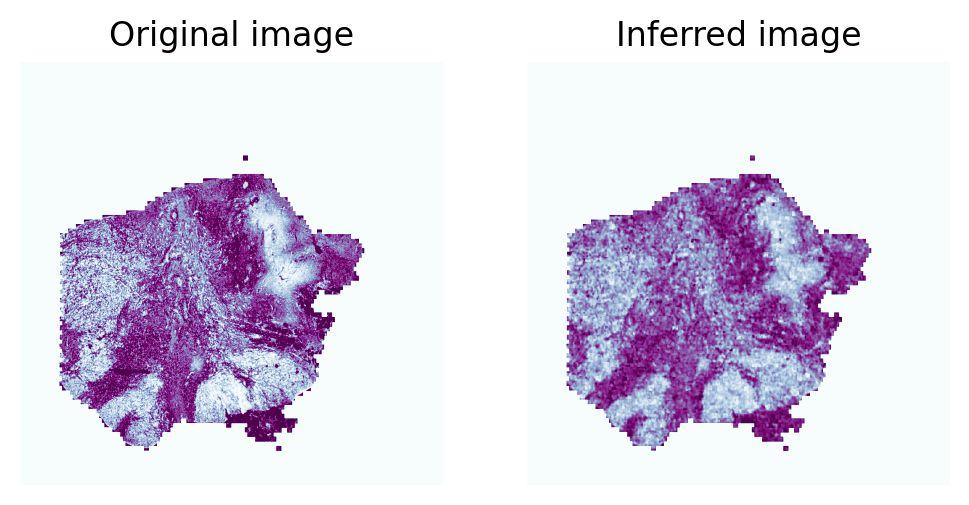

In [88]:
fig,axs=plt.subplots(1,2,figsize=(6,5),dpi=200)

ax=axs[0]
ax.imshow(wholeimg_stitch[:,:,0],cmap='BuPu',vmax=0.8,vmin=0.2)
ax.axis('off')
ax.set_title('Original image')

ax=axs[1]
ax.imshow(recon_wholeimg_stitch[:,:,0],cmap='BuPu',vmax=0.8,vmin=0.2)
ax.axis('off')
ax.set_title('Inferred image')

Text(0.5, 1.0, 'Inferred exp (decoder3_POE) VIM')

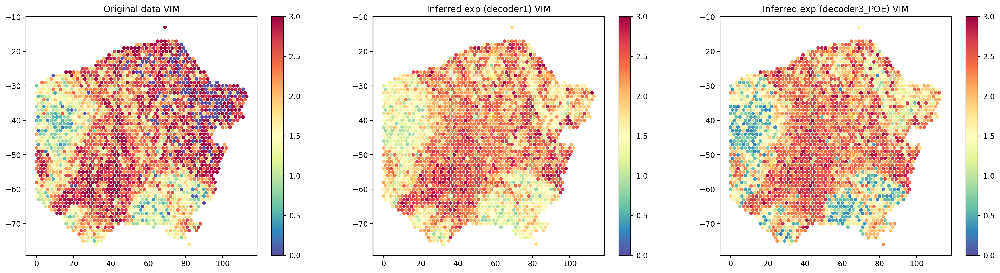

In [89]:
plotted_gene='VIM'

c_max = 3
c_min = 0

fig,axs=plt.subplots(1,3,figsize=(24,6),dpi=200)

ax=axs[0]
all_spot = np.array(trainset.genexp)
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_filtered.columns==plotted_gene)],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Original data '+plotted_gene)


ax=axs[1]
all_spot = recon_exp_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_filtered.columns==plotted_gene)],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Inferred exp (decoder1) '+plotted_gene)

ax=axs[2]
all_spot = recon_poe_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])
g=ax.scatter(all_loc[:,0],-all_loc[:,1],s=15,c=all_spot[:,np.where(adata_filtered.columns==plotted_gene)],cmap='Spectral_r',vmax=c_max,vmin=c_min)
plt.colorbar(g, ax=ax)
ax.set_title('Inferred exp (decoder3_POE) '+plotted_gene)

Text(0.5, 1.0, 'Reconstruction of decoder3(PoE)')

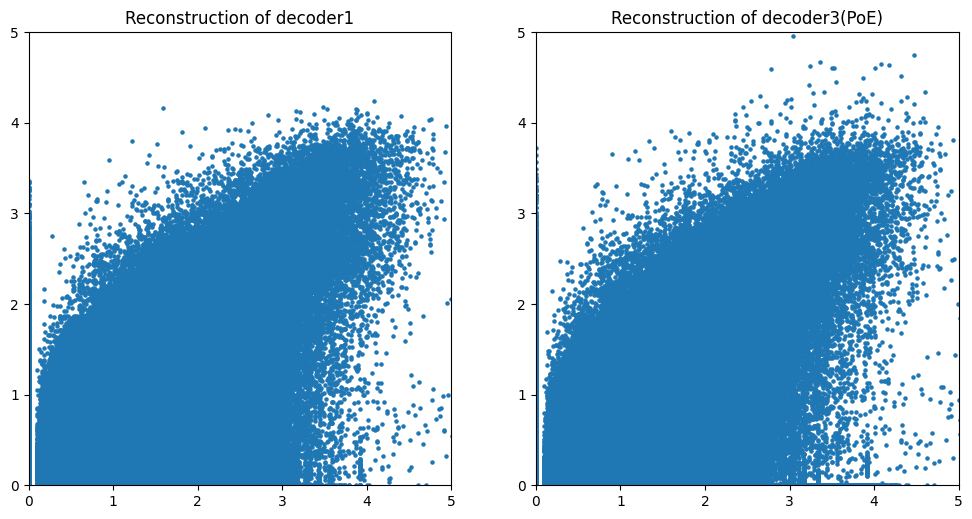

In [90]:
densi_1 = np.array(trainset.genexp).flatten()
densi_2 = recon_exp_stack.flatten()
densi_3 = recon_poe_stack.flatten()

fig,axs=plt.subplots(1,2,figsize=(12,6),dpi=100)
ax=axs[0]
ax.scatter(densi_1, densi_2, s=5)
ax.set_ylim([0,5])
ax.set_xlim([0,5])
ax.set_title('Reconstruction of decoder1')

ax=axs[1]
ax.scatter(densi_1, densi_3, s=5)
ax.set_ylim([0,5])
ax.set_xlim([0,5])
ax.set_title('Reconstruction of decoder3(PoE)')

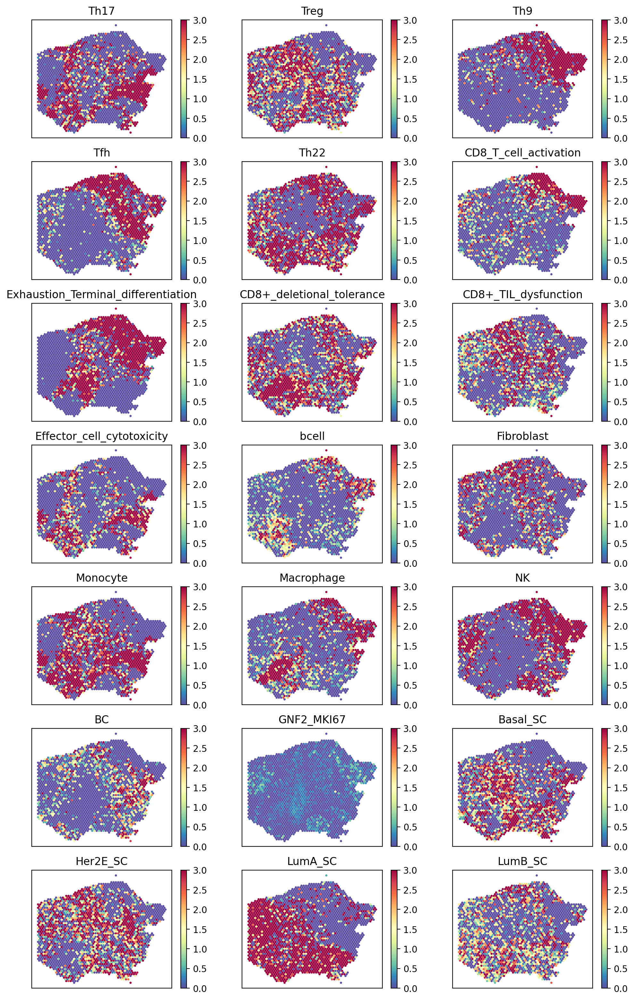

In [91]:
#'Inferred percent (decoder1)'
c_max = 3
c_min = 0

all_spot = mu_exp_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])

fig,axs= plt.subplots(7,3,figsize=(12,20),dpi=200)
for i in range(7):
    for j in range(3):
        plotted_cell_idx = i*3+j
        plotted_cell= df_sig.columns[plotted_cell_idx]
        ax=axs[i,j]
        ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=all_spot[:,plotted_cell_idx],cmap='Spectral_r',vmax=c_max,vmin=c_min)
        plt.colorbar(g, ax=ax)
        ax.set_title(plotted_cell)
        ax.set_xticks([])
        ax.set_yticks([])

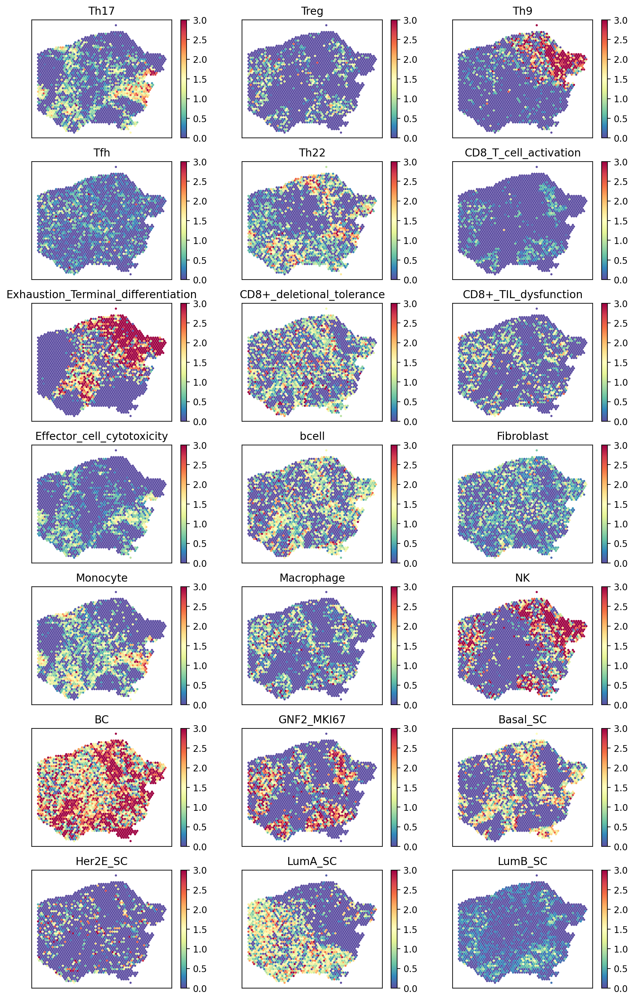

In [92]:
#'Inferred percent (decoder1)'
c_max = 3
c_min = 0

all_spot = mu_poe_stack
all_loc = np.array(trainset.map_info.loc[:,['array_col','array_row']])

fig,axs= plt.subplots(7,3,figsize=(12,20),dpi=200)
for i in range(7):
    for j in range(3):
        plotted_cell_idx = i*3+j
        plotted_cell= df_sig.columns[plotted_cell_idx]
        ax=axs[i,j]
        ax.scatter(all_loc[:,0],-all_loc[:,1],s=2,c=all_spot[:,plotted_cell_idx],cmap='Spectral_r',vmax=c_max,vmin=c_min)
        plt.colorbar(g, ax=ax)
        ax.set_title(plotted_cell)
        ax.set_xticks([])
        ax.set_yticks([])

In [93]:
from scipy.stats import gaussian_kde
def display_reconst(df_true, 
                    df_pred, 
                    density=False,
                    marker_genes=None,
                    sample_rate=0.1,
                    size=(10, 10), 
                    spot_size=10,
                    title=None
                    ):
    """
    Scatter plot - raw gexp vs. reconstructed gexp
    """
    assert 0 < sample_rate <= 1, \
        "Invalid downsampling rate for reconstruct scatter plot: {}".format(sample_rate)
    
    if marker_genes is not None:
        marker_genes = set(marker_genes)
        
    df_true_sample = df_true.sample(frac=sample_rate)
    df_pred_sample = df_pred.loc[df_true_sample.index]
    
    plt.rcParams["figure.figsize"] = size
    ax = plt.gca()
    
    
    # try pre-compute metrics to avoid for-loop throughout scatter plot
    xx = df_true_sample.T.to_numpy().flatten()
    yy = df_pred_sample.T.to_numpy().flatten()
    
    if density:
        for gene in df_true_sample.columns:
            try:
                gene_true = df_true_sample[gene].values
                gene_pred = df_pred_sample[gene].values
                gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])
                
                z = gaussian_kde(gexp_stacked)(gexp_stacked)
                ax.scatter(gene_true, gene_pred, c=z, s=spot_size)
            except np.linalg.LinAlgError as e:
                pass
                
    elif marker_genes is not None:
        color_dict = {True: 'red', False: 'green'}
        gene_colors = np.vectorize(
            lambda x: color_dict[x in marker_genes]
        )(df_true_sample.columns)
        colors = np.repeat(gene_colors, df_true_sample.shape[0])
        
        ax.scatter(xx, yy, c=colors, s=spot_size)
    
    else:
        ax.scatter(xx, yy, s=spot_size)
    
    plt.suptitle(title)

    plt.xlabel('Ground-truth')
    plt.ylabel('Reconstructed')
    plt.ylim([0,5])
    plt.xlim([0,5])
    plt.show()

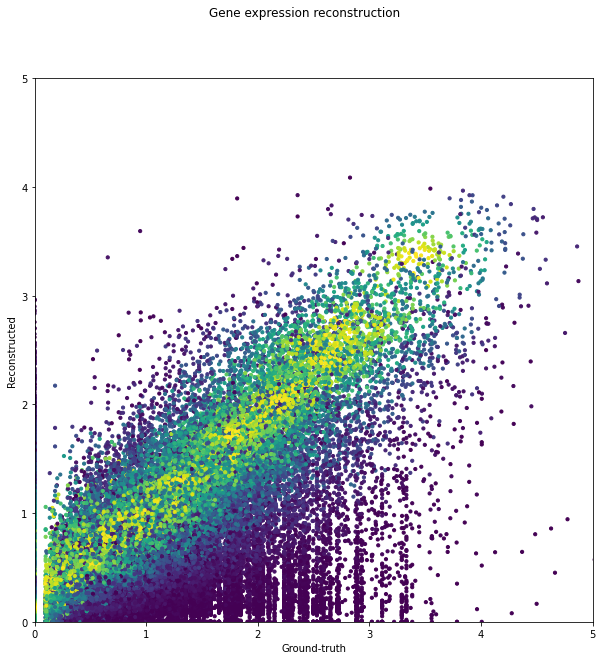

In [94]:
display_reconst(
        pd.DataFrame(np.array(trainset.genexp)),
        pd.DataFrame(recon_exp_stack),
        sample_rate=0.1,
        density=True,
        title='Gene expression reconstruction\n' 
)

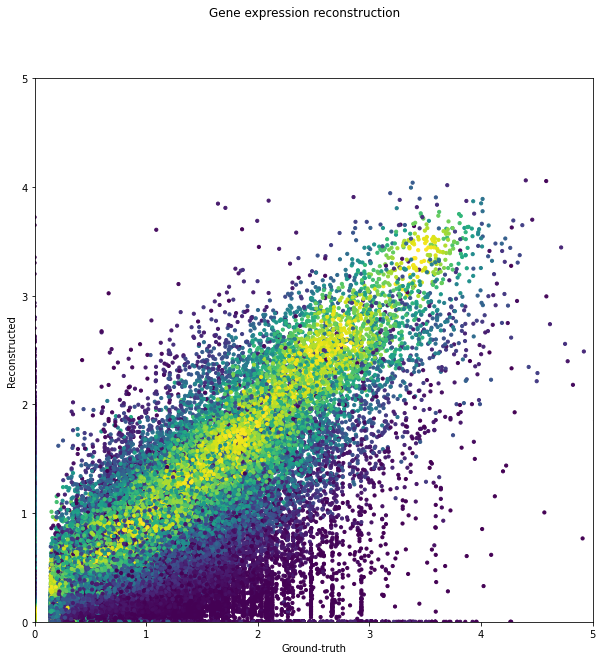

In [95]:
display_reconst(
        pd.DataFrame(np.array(trainset.genexp)),
        pd.DataFrame(recon_poe_stack),
        sample_rate=0.1,
        density=True,
        title='Gene expression reconstruction\n' 
)